In [1]:
# Import packages
import ee
import geemap
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import altair as alt
import random
import seaborn as sns
import ipywidgets as widgets
from IPython.display import display
from google.colab import drive
drive.mount('/content/drive')
from matplotlib import font_manager
sns.set()
sns.set_style("darkgrid", {"axes.facecolor": ".95"})

Mounted at /content/drive


In [75]:
from matplotlib import rcParams
from google.colab import files
rcParams.update({
    "font.size": 9,
    "axes.labelsize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8,
    "figure.titlesize": 10,
    "figure.labelsize": 10,
})

def saveplot(plotname):
    """Salva e scarica il plot corrente"""
    filename = f"{plotname}.pdf"
    plt.savefig(filename)
    files.download(filename)

from pathlib import Path

cw = 8.325/2.54
tw = 17/2.54

In [76]:
ee.Authenticate()
ee.Initialize(project='dulcet-iterator-470310-n0') # PUT YOUR API KEY (Project ID) HERE!

# Part 1: loading data

In [77]:
# this is for getting rid of edges (usually artifacted)
def mask_edge(image):
  edge = image.lt(-70.0)
  masked_image = image.mask().And(edge.Not())
  return image.updateMask(masked_image)

# testing geometry
svalbard_geom = ee.Geometry.Polygon(
    [[[2501471, 14525773],
      [2572610, 14525773],
      [2572610, 14566293],
      [2501471, 14566293],
      [2501471, 14525773]]],
    proj='EPSG:3857',
    geodesic=False
)


Sentinel-1 does not operate in a single, fixed mode all the time. It switches between modes (like IW, EW, SM, WV) based on a pre-defined mission plan. These modes have different default polarization configurations.
* Interferometric Wide Swath (IW): The most common mode over land. It is typically programmed to acquire in VV+VH (most common) or HH+HV.
* Extra Wide Swath (EW): Used over large areas like oceans and sea ice. It is often programmed for HH+HV or sometimes VV+VH.
* Wave Mode (WV): Used for sampling ocean waves. It is almost always VV only.
* Stripmap Mode (SM): Offers higher resolution and can be programmed for single (HH or VV) or dual (HH+HV or VV+VH) polarization.

For this work, based on existing literature, we focus on HH, HV, HH+HV with EW.

# Preprocessing

In [78]:
polarizations = ['HH', 'HV']
svalbard_s1_dict = {}

In [79]:

# Sentinel-1 collection for Svalbard

for pol in polarizations:
    svalbard_s1_dict[pol] = (

    ee.ImageCollection('COPERNICUS/S1_GRD')
    .filterBounds(svalbard_geom)
    .filter(ee.Filter.listContains('transmitterReceiverPolarisation', pol))
    .filter(ee.Filter.eq('instrumentMode', 'EW'))
    .select(pol)
    .map(mask_edge)
    )

  # https://www.sciencedirect.com/science/article/pii/S0034425724002116?via%3Dihub


In [80]:
svalbard_s1_pol = [
svalbard_s1HH := svalbard_s1_dict['HH'],
svalbard_s1HV := svalbard_s1_dict['HV']]

In [81]:
# time ranges
spring = ee.Filter.date('2025-03-01', '2025-04-20')
late_spring = ee.Filter.date('2025-04-21', '2025-06-10')
summer = ee.Filter.date('2025-06-11', '2025-08-31')

seasons = [spring, late_spring, summer]

In [82]:
# building the Sentinel-1 polarizations-seasons dataframe
season_names = ['spring', 'late_spring', 'summer']

svalbard_s1 = pd.DataFrame(
    index=polarizations,
    columns=season_names,
)

for pol in polarizations:
    for i, season_filter in enumerate(seasons):

        filtered_collection = svalbard_s1_dict[pol].filter(season_filter)

        svalbard_s1.loc[pol, season_names[i]] = filtered_collection

display(svalbard_s1)

,spring,late_spring,summer
HH,"ee.ImageCollection({\n ""functionInvocationVal...","ee.ImageCollection({\n ""functionInvocationVal...","ee.ImageCollection({\n ""functionInvocationVal..."
HV,"ee.ImageCollection({\n ""functionInvocationVal...","ee.ImageCollection({\n ""functionInvocationVal...","ee.ImageCollection({\n ""functionInvocationVal..."


In [83]:
svalbard_s1_spring = [
svalbard_s1HH_spring := svalbard_s1.loc['HH', 'spring'],
svalbard_s1HV_spring := svalbard_s1.loc['HV', 'spring']]

svalbard_s1_latespring = [
svalbard_s1HH_latespring := svalbard_s1.loc['HH', 'late_spring'],
svalbard_s1HV_latespring := svalbard_s1.loc['HV', 'late_spring']]

svalbard_s1_summer = [
svalbard_s1HH_summer := svalbard_s1.loc['HH', 'summer'],
svalbard_s1HV_summer := svalbard_s1.loc['HV', 'summer']]

In [84]:
s2_collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')

In [85]:
"GEMINI HELPED"

def dates_with_data(collection, geometry):
    """ Finds the dates in which layers of a collection exist in a given geometry.

        Parameters:
        :: collection = layers collection
        :: geometry   = area of interest

        Returns:
        :: dates = list of dates with data (as 'yyyy-MM-ddTHH:mm:ss' strings)
    """

    # filter the collection by geometry
    filtered_collection = collection.filterBounds(geometry)

    # get a list of all image dates in the filtered collection
    # system:time_start is an attribute of every image (= starting time of aquisition)
    image_dates = ee.List(filtered_collection.aggregate_array('system:time_start'))

    # Check if there are any images
    if image_dates.size().getInfo() > 0:
        # Convert timestamps to dates and format them as strings
        dates = image_dates.map(lambda time: ee.Date(time).format(None, 'GMT'))
        return dates.sort().getInfo()
    else:
        return None

sea_ice_geom = ee.Geometry.Polygon(
    [[[2501471, 14525773],
      [2572610, 14525773],
      [2572610, 14566293],
      [2501471, 14566293],
      [2501471, 14525773]]],
    proj='EPSG:3857',
    geodesic=False
)

dates_spring_HH = dates_with_data(svalbard_s1HH_spring, sea_ice_geom)
dates_spring_HV = dates_with_data(svalbard_s1HV_spring, sea_ice_geom)

dates_latespring = dates_with_data(svalbard_s1HH_latespring, sea_ice_geom)
dates_summer = dates_with_data(svalbard_s1HH_summer, sea_ice_geom)

# they are apparently the same
print(dates_spring_HH == dates_spring_HV)

dates_spring = dates_spring_HH
# Print the dates found
print(dates_spring)
print(dates_latespring)

True
['2025-03-01T05:50:27', '2025-03-02T06:31:37', '2025-03-03T05:34:02', '2025-03-05T05:17:33', '2025-03-06T05:58:42', '2025-03-08T05:42:13', '2025-03-09T06:23:23', '2025-03-10T05:25:47', '2025-03-11T06:06:57', '2025-03-13T05:50:28', '2025-03-14T06:31:37', '2025-03-15T05:34:02', '2025-03-17T05:17:33', '2025-03-18T05:58:42', '2025-03-20T05:42:13', '2025-03-21T06:23:23', '2025-03-22T05:25:48', '2025-03-23T06:06:57', '2025-03-25T05:50:28', '2025-03-26T06:31:37', '2025-03-27T05:34:02', '2025-03-28T05:24:44', '2025-03-29T05:17:33', '2025-03-29T06:05:44', '2025-03-30T05:58:43', '2025-04-01T05:42:14', '2025-04-02T06:23:23', '2025-04-03T05:25:48', '2025-04-04T06:06:57', '2025-04-06T05:50:28', '2025-04-07T06:31:38', '2025-04-08T05:34:02', '2025-04-10T05:17:33', '2025-04-10T06:05:45', '2025-04-11T05:58:42', '2025-04-12T05:49:22', '2025-04-13T05:42:13', '2025-04-14T06:23:23', '2025-04-15T05:25:47', '2025-04-16T06:06:57', '2025-04-17T05:57:34', '2025-04-18T05:50:28', '2025-04-19T06:31:38']
['202

By using only HH and HV we make sure to have images of the same location always at the same time. Probably the acquisition method of S1 has always been EW in the last thre years (?)

### Visualizing S1 data for different seasons

In [86]:
#@title Spring

rnd_state = 122
random.seed(rnd_state) #35
# Spring
SpringMap = geemap.Map()
SpringMap.centerObject(svalbard_geom, zoom=6)
spring_list = svalbard_s1HH_spring.toList(svalbard_s1HH_spring.size())
spring_s1_mosaics = []
spring_s1_day_mosaics = []

cmaps = ['bone', 'viridis']

if dates_spring:
        rnd_date_str = random.choice(dates_spring)
        rnd_date = ee.Date(rnd_date_str)

else:
        print("No HH data dates found in spring to select a random date from.")

date = ee.Date('2025-04-08')

# adding some layers
for cmap, ic, pol in zip(cmaps, svalbard_s1_spring, polarizations):
    # adding season mosaics (whole spring)
    ic_mosaic = ic.mosaic()
    spring_s1_mosaics.append(ic_mosaic)
    #SpringMap.addLayer(ic_mosaic, {'min': -25, 'max': 5}, f'{pol} Mosaic')

    # adding random daily mosaics
    # check if the date list is not empty

    ic_date = ic.filterDate(date, date.advance(1, 'day')) # Filter for the whole day

    # mosaic the images for the selected date
    ic_day_mosaic = ic_date.mosaic()
    spring_s1_day_mosaics.append(ic_day_mosaic)

    # add the mosaicked image from the random date to the map
    SpringMap.addLayer(ic_day_mosaic, {'min': -35, 'max': 10, 'palette': 'bone'}, f'{pol} on {date.format("YYYY-MM-dd").getInfo()}')

SpringMap

Map(center=[78.32673233318731, 22.790622575802143], controls=(WidgetControl(options=['position', 'transparent_…

In [87]:
#@title Late Spring

rnd_state = 56
random.seed(rnd_state) #35
# Late Spring
LateSpringMap = geemap.Map()
LateSpringMap.centerObject(svalbard_geom, zoom=6)
late_spring_s1_mosaics = []
late_spring_s1_day_mosaics = []

# pick random date from late spring dates
if dates_latespring:
        rnd_date_str = random.choice(dates_latespring)
        rnd_date = ee.Date(rnd_date_str)

else:
        print("No HH data dates found in late spring to select a random date from.")

# adding some layers for late spring
for cmap, ic, pol in zip(cmaps, svalbard_s1_latespring, polarizations): # Changed from svalbard_s1_spring
    # adding season mosaics (whole late spring)
    ic_mosaic = ic.mosaic()
    late_spring_s1_mosaics.append(ic_mosaic) # Changed variable name
    #LateSpringMap.addLayer(ic_mosaic, {'min': -25, 'max': 5}, f'{pol} Late Spring Mosaic') # Example of adding mosaic

    # adding random daily mosaics
    # check if the date list is not empty

    ic_date = ic.filterDate(rnd_date, rnd_date.advance(1, 'day')) # Filter for the whole day

    ic_day_mosaic = ee.Image(ic_date.mosaic())
    late_spring_s1_day_mosaics.append(ic_day_mosaic)

    # add the mosaicked image from the random date to the map
    LateSpringMap.addLayer(ic_day_mosaic, {'min': -65, 'max': 10, 'palette': 'bone', 'cmap': cmap}, f'{pol} on {rnd_date.format("YYYY-MM-dd").getInfo()} (Late Spring)') # Updated layer name

LateSpringMap # Display the new map variable

Map(center=[78.32673233318731, 22.790622575802143], controls=(WidgetControl(options=['position', 'transparent_…

In [88]:
#@title Summmer

rnd_state = 23
random.seed(rnd_state) #35
# Summer
SummerMap = geemap.Map()
SummerMap.centerObject(svalbard_geom, zoom=6)
summer_s1_mosaics = []
summer_s1_day_mosaics = []
cmaps = ['bone', 'viridis']


if dates_summer:
        rnd_date_str = random.choice(dates_summer)
        rnd_date = ee.Date(rnd_date_str)

else:
        print("No HH data dates found in summer to select a random date from.")

date = ee.Date('2025-08-28')
# adding some layers for summer
for cmap, ic, pol in zip(cmaps, svalbard_s1_summer, polarizations): # Changed from svalbard_s1_latespring
    # adding season mosaics (whole summer)
    ic_mosaic = ic.mosaic()
    summer_s1_mosaics.append(ic_mosaic) # Changed variable name
    #SummerMap.addLayer(ic_mosaic, {'min': -25, 'max': 5}, f'{pol} Summer Mosaic') # Example of adding mosaic

    # adding random daily mosaics
    # check if the date list is not empty


    ic_date = ic.filterDate(date, date.advance(1, 'day')) # Filter for the whole day

    # mosaic the images for the selected date
    ic_day_mosaic = ic_date.mosaic()
    summer_s1_day_mosaics.append(ic_day_mosaic) # Changed variable name

    # add the mosaicked image from the random date to the map
    SummerMap.addLayer(ic_day_mosaic, {'min': -40, 'max': 10, 'palette': 'bone', 'cmap': cmap}, f'{pol} on {date.format("YYYY-MM-dd").getInfo()} (Summer)') # Updated layer name

SummerMap

Map(center=[78.32673233318731, 22.790622575802143], controls=(WidgetControl(options=['position', 'transparent_…

# Sampling

The following cell is for defining all the different samples geometries

In [89]:
# since I have already defined the polygon this cell is unuseful, but I will keep it just in case I'll need a new polygon
drawn_features = LateSpringMap.draw_last_feature
drawn_rectangle = drawn_features

if drawn_rectangle:
    # get the geometry of the feature
    rectangle_geometry = drawn_rectangle.geometry()

    # get the coordinates of the geometry as a Python object
    coordinates = rectangle_geometry.getInfo()['coordinates']

    # print the coordinates
    print("Coordinates of the drawn rectangle:")
    print(coordinates)
else:
    print("Cannot extract coordinates as no rectangle feature is available.")

savegeom = ee.Geometry.Polygon(coordinates)
savegeom

Cannot extract coordinates as no rectangle feature is available.


ee.Geometry({
  "functionInvocationValue": {
    "functionName": "GeometryConstructors.Polygon",
    "arguments": {
      "coordinates": {
        "constantValue": [
          [
            [
              16.169963,
              79.932078
            ],
            [
              16.169963,
              81.120388
            ],
            [
              28.956149,
              81.120388
            ],
            [
              28.956149,
              79.932078
            ],
            [
              16.169963,
              79.932078
            ]
          ]
        ]
      },
      "evenOdd": {
        "constantValue": true
      }
    }
  }
})

In [90]:
image = late_spring_s1_day_mosaics[0].select('HH')

# This handles large exports better
geemap.ee_export_image(
    image,
    filename='sar_large.tif',
    scale=1000,
    region=savegeom,
    crs='EPSG:3857',
    file_per_band=False
)

Generating URL ...
Please wait ...
Data downloaded to /content/sar_large.tif


In [91]:
# this is a good area to see a bit how the radar performs with sea ice. In the selected date
# (seed = 35, 2025-04-12), there is some bare ice, different ice textures, snow on ice and deep sea water
test_geom = ee.Geometry.Polygon([[36.683029, 80.070371], [36.683029, 80.390982], [40.747361, 80.390982], [40.747361, 80.070371], [36.683029, 80.070371]])

# define samples for specific features

# LateSpringMap - 2025-06-03 - a bit of eveything. Let's stick to a very general sampling of sea ice without ice types discrimination, for now
samplegeoms = [
    calmwater_samplegeom1 := ee.Geometry.Polygon([[14.11123, 79.847462], [14.11123, 79.876108], [14.311775, 79.876108], [14.311775, 79.847462], [14.11123, 79.847462]]),
    calmwater_samplegeom2 := ee.Geometry.Polygon([[14.274256, 78.150859], [14.274256, 78.207686], [14.562712, 78.207686], [14.562712, 78.150859], [14.274256, 78.150859]]),
    calmwater_samplegeom3 := ee.Geometry.Polygon([[11.424441, 78.620255], [11.424441, 78.671354], [11.64147, 78.671354], [11.64147, 78.620255], [11.424441, 78.620255]]),
    wavywater_samplegeom1 := ee.Geometry.Polygon([[17.067172, 80.006467], [17.067172, 80.04951], [17.488709, 80.04951], [17.488709, 80.006467], [17.067172, 80.006467]]),
    wavywater_samplegeom2 := ee.Geometry.Polygon([[24.384252, 79.167722], [24.384252, 79.218191], [24.911713, 79.218191], [24.911713, 79.167722], [24.384252, 79.167722]]),
    wavywater_samplegeom3 := ee.Geometry.Polygon([[13.554466, 80.052358], [13.554466, 80.090243], [13.841548, 80.090243], [13.841548, 80.052358], [13.554466, 80.052358]]),
    seaice_samplegeom1 := ee.Geometry.Polygon([[21.419154, 80.414107], [21.419154, 80.47452], [21.935434, 80.47452], [21.935434, 80.414107], [21.419154, 80.414107]]),
    seaice_samplegeom2 := ee.Geometry.Polygon([[16.479344, 80.963004], [16.479344, 81.034338], [17.165887, 81.034338], [17.165887, 80.963004], [16.479344, 80.963004]]),
    seaice_samplegeom3 := ee.Geometry.Polygon([[29.168124, 79.538626], [29.168124, 79.674392], [30.316025, 79.674392], [30.316025, 79.538626], [29.168124, 79.538626]])
    ]

## Sample Map with S1 and S2

In [92]:
# Sentinel-2 false color for 2025-06-03
sampleimages = late_spring_s1_day_mosaics
s2_collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')

s2_image = s2_collection.filterBounds(svalbard_geom).filterDate('2025-06-03', '2025-06-04') # Filter for the whole day

s2_image_filtered = s2_image.filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', 30)
false_color_bands = ['B8', 'B4', 'B3']
s2_false_color = s2_image_filtered.select(false_color_bands)
s2_false_color_composite = s2_false_color.median()
false_color_vis = {
    'min': 0,
    'max': 3000,
    'bands': false_color_bands
}

In [93]:
names = ['calm water 1', 'calm water 2', 'calm water 3',
         'wavy water 1', 'wavy water 2', 'wavy water 3',
         'sea ice 1', 'sea ice 2', 'sea ice 3']
colors = ['green', 'green', 'green',
          'orange', 'orange', 'orange',
          'royalblue', 'royalblue', 'royalblue']

SampleMap = geemap.Map()
SampleMap.centerObject(svalbard_geom, zoom=6)
SampleMap.addLayer(sampleimages[0], {'min': -65, 'max': 10, 'palette': 'bone'}, name='HH (2025-06-08)')
SampleMap.addLayer(sampleimages[1], {'min': -65, 'max': 10, 'palette': 'bone'}, name='HV (2025-06-08)')
SampleMap.addLayer(s2_false_color_composite, false_color_vis, 'Sentinel-2 False Color (2025-06-03)')
for i, geom in enumerate(samplegeoms):
  SampleMap.addLayer(geom, {'color' : colors[i]}, name=names[i])

SampleMap

Map(center=[78.32673233318731, 22.790622575802143], controls=(WidgetControl(options=['position', 'transparent_…

In [94]:
for i,geom in enumerate(samplegeoms):
    roi_fc = ee.FeatureCollection([ee.Feature(geom)])
    geemap.ee_export_vector(
    roi_fc,
    filename=f'samplegeom{i}.shp',
    verbose=True
)

Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom0.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom1.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom2.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom3.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom4.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom5.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom6.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom7.shp
Generating URL ...
Please wait ...
Data downloaded to /content/samplegeom8.shp


In [95]:
feature_types = [
        'calm_water',
        'wavy_water',
        'sea_ice'
    ]

In [96]:
#@title Sampling rectangles and getting all pixel values
"""GEMINI HELPED"""

def sampling_df(nb_points=1000):
    sampleimage = late_spring_s1_day_mosaics

    # CORREZIONE: Usa il numero corretto di righe
    df = pd.DataFrame(
        index=range(len(samplegeoms)),  # Questo dovrebbe essere 9
        columns=range(len(sampleimage))
    )

    feature_types = [
        'calm_water', 'calm_water', 'calm_water',
        'wavy_water', 'wavy_water', 'wavy_water',
        'sea_ice', 'sea_ice', 'sea_ice'
    ]

    for j, image in enumerate(sampleimage):
        pol_label = polarizations[j]

        for i, geom in enumerate(samplegeoms):
            # generate random points
            random_points = ee.FeatureCollection.randomPoints(geom, nb_points, seed=42)

            # sample pixel values
            sampled = image.sampleRegions(
                collection=random_points,
                scale=10,
                geometries=True
            )

            # get the sampled values
            sampled_list = sampled.getInfo()
            values = [feature['properties'][pol_label] for feature in sampled_list['features']
                     if pol_label in feature['properties']]

            if i < len(df):
                df.iloc[i, j] = values

    df['feature_type'] = feature_types
    df.columns = list(polarizations) + ['feature_type']
    df_grouped = df.groupby('feature_type').agg({
        'HH': 'sum',
        'HV': 'sum'
    })

    return df_grouped

In [97]:
df = sampling_df(1000)
df

,HH,HV
feature_type,,
calm_water,"[-48.51025483570713, -49.09594954646799, -49.0...","[-49.09116965466235, -49.09594954646799, -44.7..."
sea_ice,"[-11.221306902440007, -10.58672808029058, -14....","[-24.04218566362838, -22.609298558180395, -24...."
wavy_water,"[-21.58233236805923, -23.50252302483051, -27.1...","[-37.515059425983466, -41.30249321749624, -41...."


In [98]:
df.to_csv('dataframe.csv', index=False)

# Sea Ice Index

## Computing sample means

In [35]:
cov_matrices = []
meansHH = []
meansHV = []
hhhv_devs = []

for i, row in enumerate(df.iterrows()):
    hhi = df.iloc[i, 0]
    hvi = df.iloc[i, 1]
    meansHH.append(np.mean(hhi))
    meansHV.append(np.mean(hvi))

    print(f"Mean HH for {feature_types[i]}: {meansHH[i]:.3f}")
    print(f"Mean HV for {feature_types[i]}: {meansHV[i]:.3f}")
    print("-----------------------")

Mean HH for calm_water: -43.513
Mean HV for calm_water: -45.031
-----------------------
Mean HH for wavy_water: -12.536
Mean HV for wavy_water: -25.733
-----------------------
Mean HH for sea_ice: -23.564
Mean HV for sea_ice: -41.267
-----------------------


In [36]:
meansHH

[np.float64(-43.51281010153601),
 np.float64(-12.535767761710638),
 np.float64(-23.564243374089187)]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

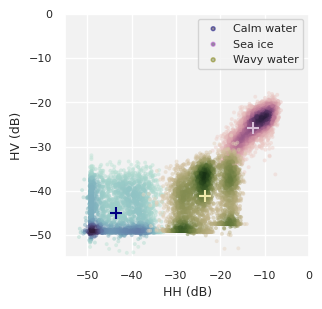

In [37]:
from scipy.stats import gaussian_kde
# https://stackoverflow.com/questions/20105364/how-can-i-make-a-scatter-plot-colored-by-density

labels = ['Calm water', 'Sea ice', 'Wavy water']
HHth = -15
HVth = -30
feature_types = df.index

palette1 = sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True)
palette2 = sns.cubehelix_palette(as_cmap=True)
palette3 = sns.cubehelix_palette(start=2, rot=-.3, as_cmap=True)
cmaps = [palette1,
         palette2,
         palette3
          ]
colors = ['navy', 'thistle', 'palegoldenrod']

plt.figure(figsize=(cw, cw))
for i, feature in enumerate(feature_types):
    hh = df.loc[feature, 'HH']
    hv = df.loc[feature, 'HV']

    # Ensure hh and hv have the same length by truncating the longer list
    min_len = min(len(hh), len(hv))
    hh = hh[:min_len]
    hv = hv[:min_len]

    hhhv = np.vstack([hh,hv])
    z = gaussian_kde(hhhv)(hhhv)

    plt.scatter(hh, hv, c=z, cmap=cmaps[i],
                s=8,
                alpha=0.5,
                edgecolors='none',
                label=labels[i]
                )


plt.xlim(-55, 0)
plt.ylim(-55, 0)
for i, mean in enumerate(meansHH):
    plt.scatter(meansHH[i], meansHV[i],
                marker="+", s=85, c=colors[i], )

plt.xlabel('HH (dB)')
plt.ylabel('HV (dB)')
plt.legend()
plt.gca().set_aspect('equal')
plt.tight_layout()

ax = plt.gca()
leg = ax.get_legend()
leg.legend_handles[0].set_color('navy')
leg.legend_handles[1].set_color('mediumorchid')
leg.legend_handles[2].set_color('olive')
saveplot('samples_scatter')

Exploring covariance and means

We are now looking for a good value of the sum of sea ice sample means:

$$
\mu_{\text{sea ice}}^{\text{sum}} = \overline{\mathrm{HH}}_{\text{sea ice}} + \overline{\mathrm{HV}}_{\text{sea ice}}
$$

to use for computing the index:

$$
\text{Sea Ice Index} = \left( \frac{\mu_{\text{sea ice}}^{\text{sum}}}{\mathrm{HH} + \mathrm{HV}} \right) ^2
$$

Where the square is meant to have positive values only.
For this purpose, we want to see how this quantity evolves by varyoing the number of pixel samples. We also want a variance estimate, that in this case corresponds to:

$$
\sigma^2 = \sigma_{\mathrm{HH}}^2 + \sigma_{\mathrm{HV}}^2 + 2\sigma_{\mathrm{HH,HV}}^2
$$

In [2]:
#@ Computing the index
nb_points_list = np.logspace(1, 5, 20).astype(int)

seaice_means_sum = []
seaice_stds = []

for n, nb_points in enumerate(nb_points_list):
    dfn = sampling_df(int(nb_points))
    hhn = dfn.loc['sea_ice', 'HH']
    hvn = dfn.loc['sea_ice', 'HV']
    print(len(hhn), len(hvn))

    hhn_clean = []
    hvn_clean = []

    # DeepSeek solution for removing NaN and aligning HH and HV
    for x, y in zip(hhn, hvn):
        if not np.isnan(x) and not np.isnan(y):
            hhn_clean.append(x)
            hvn_clean.append(y)

    means_sum = np.mean(hhn_clean) + np.mean(hvn_clean)
    cov = np.cov(hhn_clean, hvn_clean)

    print(f"Iteration {n}, means sum = {means_sum}")
    seaice_means_sum.append(means_sum)
    std = np.sqrt(cov[0, 0] + cov[1, 1] + 2*cov[0, 1])
    meanstd = std / np.sqrt(nb_points)
    seaice_stds.append(meanstd)

    if n >= 1:
        if np.abs(seaice_means_sum[n] - seaice_means_sum[n-1]) < 0.03:
            print(f"convergence: iteration {n}, nb points {nb_points}")
            break

# we can't stay below 0.01 because EE doesn't support calculation on higher values of pixel numbers.

NameError: name 'sampling_df' is not defined

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

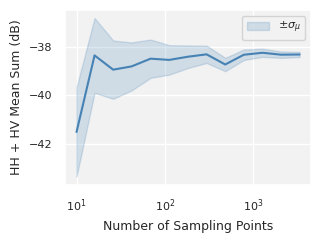

In [100]:
purple = "steelblue"
plt.figure(figsize=(cw, 2.5))
plt.plot(nb_points_list[:len(seaice_means_sum)], seaice_means_sum, c=purple)
plt.fill_between(nb_points_list[:len(seaice_means_sum)],
                 np.array(seaice_means_sum) - np.array(seaice_stds),
                 np.array(seaice_means_sum) + np.array(seaice_stds),
                 color=purple,
                 alpha=0.2,
                 label=r"$\pm \sigma_{\mu}$")
plt.xlabel('Number of sampling points')
plt.ylabel('HH + HV Mean Sum (dB)')
plt.xscale('log')
plt.legend()
plt.xlabel('Number of Sampling Points')
plt.ylabel('HH + HV Mean Sum (dB)')
plt.tight_layout()
saveplot('meanssum')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

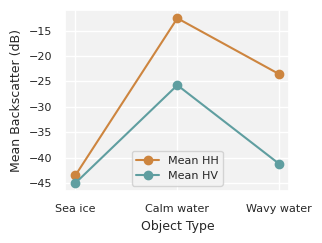

In [101]:
plt.figure(figsize=(cw, 2.5))
plt.plot(meansHH, "o-", label='Mean HH', c='peru')
plt.plot(meansHV, "o-", label='Mean HV', c='cadetblue')

# Set custom x-axis ticks and labels
plt.xticks(ticks=[0, 1, 2], labels=labels)

plt.xlabel('Object Type')
plt.ylabel('Mean Backscatter (dB)')
plt.legend()
plt.tight_layout()
saveplot('means')

In [102]:
seaice_factor = seaice_means_sum[-1].round(2)

In [103]:
# compute index for the three season samples
sampleimages = [
    spring_s1_day_mosaics,
    late_spring_s1_day_mosaics,
    summer_s1_day_mosaics
]

# define outline and exclude land
svalbard_outline = ee.FeatureCollection("USDOS/LSIB_SIMPLE/2017") \
        .filter(ee.Filter.eq('country_na', 'Svalbard'))
arctic_bounds = ee.Geometry.Rectangle([-10, 74, 40, 82])
inverse_geometry = arctic_bounds.difference(svalbard_outline.geometry())

maps = [
    SpringMap,
    LateSpringMap,
    SummerMap
]

seaice_index_images = []

In [104]:
for i, images in enumerate(sampleimages):
    hh_image = images[0]
    hv_image = images[1]

    combined_image = hh_image.addBands(hv_image.select('HV'))
    combined_image_no_land = combined_image.clip(inverse_geometry)

    hh = combined_image_no_land.select('HH')
    hv = combined_image_no_land.select('HV')

    # index
    hh_plus_hv = hh.add(hv)
    sea_ice_index = (hh_plus_hv.pow(-1).multiply(seaice_factor)).pow(2)

    maps[i].addLayer(sea_ice_index, {'palette':'viridis'}, 'Sea Ice Index')

    for j, geom in enumerate(samplegeoms):
        maps[i].addLayer(geom, {'color' : colors[i]}, name=names[j])

    geemap.ee_export_image(
    sea_ice_index,
    filename=f'sii_{i}.tif',
    scale=500,
    crs='EPSG:3857',
    region=savegeom,
    file_per_band=False
)

# visualization problem: the clip include some land glaciers, which may reduce the intensity of the index on thinner sea ice
hbox = widgets.HBox([SpringMap, LateSpringMap, SummerMap])
display(hbox)

Generating URL ...
Please wait ...
Data downloaded to /content/sii_0.tif
Generating URL ...
Please wait ...
Data downloaded to /content/sii_1.tif
Generating URL ...
Please wait ...
Data downloaded to /content/sii_2.tif


In [105]:
geemap.ee_export_image(
    seaice_index_images[0],
    filename="seaice.tif",
    scale=100,
    region=svalbard_geom,
    file_per_band=False

IndexError: list index out of range

# Clustering and classifying

*   K-means on samples
*   Gaussian Mixtures on image



In [106]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

In [107]:
len(df.iloc[2,1])

3000

In [108]:
feature_types = df.index

all_hh_values = []
all_hv_values = []

for feature_type in feature_types:
    hh_list = df.loc[feature_type, 'HH']
    hv_list = df.loc[feature_type, 'HV']

    all_hh_values.extend(hh_list)
    all_hv_values.extend(hv_list)

min_total_len = min(len(all_hh_values), len(all_hv_values))
all_hh_values = all_hh_values[:min_total_len]
all_hv_values = all_hv_values[:min_total_len]

all_hh_np = np.array(all_hh_values)
all_hv_np = np.array(all_hv_values)

samplematrix = np.column_stack([all_hh_np, all_hv_np])

print("Shape of samplematrix:", samplematrix.shape)

Shape of samplematrix: (8974, 2)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

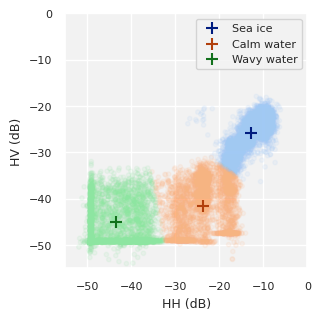

In [109]:
#@title K-means
# DeepSeek helped with ListedClorMap
from matplotlib.colors import ListedColormap

common_params = {"n_init": "auto",
    "random_state": 67,
    "max_iter" : 1000
}

# train K-means
kmeans = KMeans(n_clusters=3,
                **common_params)
kmeans = kmeans.fit(samplematrix)

cmap=sns.color_palette("pastel", 3)
cmap2=sns.color_palette("dark", 3)
dcmap = ListedColormap(cmap)
clusters = kmeans.labels_

kmeans_centroids = kmeans.cluster_centers_
samples_centroids = np.column_stack([
    meansHH,
    meansHV
])

plt.figure(figsize=(cw, cw))
plt.scatter(
    samplematrix[:,0],
    samplematrix[:,1],
    c=clusters,
    cmap=dcmap,
    s=10,
    alpha=0.1,
)
labels=['Sea ice', 'Calm water', 'Wavy water']
for i,centroid in enumerate(kmeans_centroids):
    plt.scatter(centroid[0], centroid[1],
        marker="+", s=85, c=cmap2[i], label=labels[i]
    )
plt.legend()
plt.xlim(-55, 0)
plt.ylim(-55, 0)
plt.xlabel('HH (dB)')
plt.ylabel('HV (dB)')
plt.tight_layout()
saveplot('kmeans')

In [110]:
samples_centroids = np.column_stack([
    meansHH,
    meansHV
])
temp = samples_centroids[0]
temp1 = samples_centroids[1]
temp2 = samples_centroids[2]
samples_centroids = np.array([temp1, temp, temp2])

In [111]:
np.concatenate([samples_centroids, kmeans_centroids], axis=1)

array([[-12.53576776, -25.73327588, -12.71500961, -25.84036555],
       [-43.5128101 , -45.03103761, -23.74424291, -41.47744708],
       [-23.56424337, -41.26712528, -43.5342809 , -45.07970415]])

In [112]:
"""GEMINI HELPED"""

def centroids_classification(image, centroids):

    bands = image.select(['HH', 'HV'])

    # euclidean centroids distances
    distance_bands = []
    for i, centroid in enumerate(centroids):

        # squared difference for HH and HV bands - (bandvalue - bandcentroid)^2
        hh_diff_sq = bands.select('HH').subtract(centroid[0]).pow(2)
        hv_diff_sq = bands.select('HV').subtract(centroid[1]).pow(2)

        # sum squared differences to get squared Euclidean distance
        distance_sq = hh_diff_sq.add(hv_diff_sq).rename(f'dist_{i}')
        distance_bands.append(distance_sq)

    # combine distances in bands
    all_distances = ee.Image.cat(distance_bands)

    # find cluster with minimum distance. Reducer aggregates bands and in this case it finds the minimum band value
    min_distance = all_distances.reduce(ee.Reducer.min())

    # find the index of the band that equals the minimum distance at each pixel
    # create a mask for where each band equals the minimum
    masks = all_distances.eq(min_distance)

    # multiply each band index by its mask and sum up to get the cluster index
    band_indices = ee.Image.constant([i for i in range(len(centroids))])
    mask_band_names = [f'mask_{i}' for i in range(len(centroids))]
    masks = masks.rename(mask_band_names)
    indexed_masks = masks.multiply(band_indices)
    cluster_map = indexed_masks.reduce(ee.Reducer.sum()).rename('cluster')


    # Return the original image with the added cluster map band
    return image.addBands(cluster_map), all_distances

In [73]:
nb_centroids = len(kmeans_centroids)

classified_images = []

classified_vis_params = {
    'min': 0,
    'max': nb_centroids - 1,
    'palette': ['#56fcc1', '#1b3f76', '#3e7ce6']
}

for i, images in enumerate(sampleimages):
    hh_image = images[0]
    hv_image = images[1]

    combined_image = hh_image.addBands(hv_image.select('HV'))
    combined_image_no_land = combined_image.clip(inverse_geometry)

    classified_image, distance_bands = centroids_classification(combined_image_no_land, kmeans_centroids)
    classified_images.append(classified_image)

    epsilon = ee.Image(0.001)
    inv_dist_0 = distance_bands.select('dist_0').add(epsilon).pow(-1)
    inv_dist_1 = distance_bands.select('dist_1').add(epsilon).pow(-1)
    inv_dist_2 = distance_bands.select('dist_2').add(epsilon).pow(-1)
    sum_inv = inv_dist_0.add(inv_dist_1).add(inv_dist_2)
    prob_seaice = inv_dist_0.divide(sum_inv).clip(inverse_geometry)

    maps[i].addLayer(classified_image.select('cluster'), classified_vis_params, 'K-means classification')
    maps[i].addLayer(prob_seaice, {}, 'Prob Sea Ice')

    geemap.ee_export_image(
    classified_image.clip(inverse_geometry),
    filename=f'kmeans_class_{i}.tif',
    scale=1000,
    crs='EPSG:3857',
    region=savegeom,
    file_per_band=False)

    geemap.ee_export_image(
    prob_seaice,
    filename=f'seaice_prob_{i}.tif',
    scale=1000,
    crs='EPSG:3857',
    region=savegeom,
    file_per_band=False)

hbox = widgets.HBox([SpringMap, LateSpringMap, SummerMap])
display(hbox)

Generating URL ...
Please wait ...
Data downloaded to /content/kmeans_class_0.tif
Generating URL ...
Please wait ...
Data downloaded to /content/seaice_prob_0.tif
Generating URL ...
Please wait ...
Data downloaded to /content/kmeans_class_1.tif
Generating URL ...
Please wait ...
Data downloaded to /content/seaice_prob_1.tif
Generating URL ...
Please wait ...
Data downloaded to /content/kmeans_class_2.tif
Generating URL ...
Please wait ...
Data downloaded to /content/seaice_prob_2.tif


In [129]:
"""GEMINI HELPED"""

# Load Sentinel-2 Surface Reflectance data
s2_collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')

# Filter Sentinel-2 data by geometry and date
# Using a date range around the Late Spring S1 image displayed in SampleMap
s2_filtered = s2_collection.filterBounds(svalbard_geom) \
                           .filterDate('2025-06-01', '2025-06-10') \
                           .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)) # Filter for less than 20% cloud cover

# Define the NDSI formula: (Green - SWIR1) / (Green + SWIR1)
# Sentinel-2 bands: B3 (Green), B11 (SWIR1)
def calculate_ndsi(image):
  """Calculates NDSI for a Sentinel-2 image."""
  ndsi = image.normalizedDifference(['B3', 'B11']).rename('NDSI')
  return image.addBands(ndsi)

# Map the NDSI calculation over the filtered collection
s2_with_ndsi = s2_filtered.map(calculate_ndsi)

# Create a median composite of the NDSI band
ndsi_image = s2_with_ndsi.select('NDSI').median()

# Define visualization parameters for NDSI
# High NDSI values (e.g., > 0.4) typically indicate snow/ice
ndsi_vis = {
    'min': 0.0,
    'max': 1.0,
    'palette': ['0000FF', '00FFFF', '00FF00', 'FFFF00', 'FF0000'] # Example palette (blue to red)
}

# Add the NDSI layer to the SampleMap
LateSpringMap.addLayer(ndsi_image, ndsi_vis, 'Sentinel-2 NDSI (2025-06)')

# Display the map
LateSpringMap

Map(bottom=1196.0, center=[80.17871349622823, 30.959472656250004], controls=(WidgetControl(options=['position'…

In [118]:
SampleMap

Map(bottom=2568.0, center=[78.22451306101968, 25.609130859375004], controls=(WidgetControl(options=['position'…

## Probability classification

In [134]:
predictions = []
latespring_pred = classified_images[1].select('cluster')
nb_points = 1000
for i, geom in enumerate(samplegeoms):
            random_points = ee.FeatureCollection.randomPoints(geom, nb_points, seed=42)

            # Sample pixel values
            prediction = latespring_pred.sampleRegions(
                collection=random_points,
                scale=10,
                geometries=True)
            predictions.append(prediction)

In [135]:
y_pred_list = []
y_pred_len = []

for prediction in predictions:
    features_list = prediction.getInfo()['features']
    fc_list = [feature['properties'].get('cluster', None) for feature in features_list]
    y_pred_list.append(fc_list)
    y_pred_len.append(len(fc_list))

In [136]:
y_pred_len

[1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 982]

In [137]:
sumlist = []
for i in range(len(y_pred_list)):
    sumlist += y_pred_list[i]

all_preds = np.array(sumlist)
all_preds.shape

(8982,)

In [138]:
y=y_pred_len
v1 = np.full((y[0]+y[1]+y[2],), 1)
v2 = np.full((y[3]+y[4]+y[5],), 2)
v3 = np.full((y[6]+y[7]+y[8],), 0)

all_trues = np.concatenate((v1, v2, v3))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

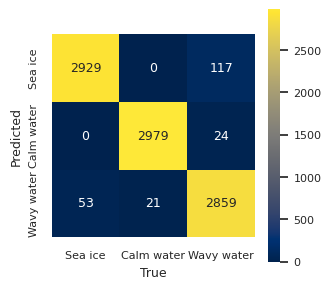

In [143]:
from sklearn.metrics import confusion_matrix, classification_report

cm = confusion_matrix(all_preds, all_trues)
plt.figure(figsize=(cw, cw))
sns.heatmap(cm, annot=True, fmt='d', cmap='cividis')
plt.ylabel('Predicted')
plt.xlabel('True')
plt.yticks([0.5, 1.5, 2.5], labels)
plt.xticks([0.5, 1.5, 2.5], labels)
plt.gca().set_aspect('equal')
saveplot('confusionmatrix')
plt.show()

In [140]:
#@title Classification statistics

# Cohen's kappa
from sklearn.metrics import cohen_kappa_score

kappa = cohen_kappa_score(all_trues, all_preds)
print(f"Cohen's Kappa: {kappa:.4f}")

# overall accuracy
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(all_trues, all_preds)
print(f"Overall Accuracy: {accuracy:.4f}")

Cohen's Kappa: 0.9641
Overall Accuracy: 0.9761
